# Visualización y Análisis Geográfico del Mapa Hexagonal H3 (Bogotá Urbana - Resolución 9)

Este notebook visualiza y analiza la distribución espacial de los **Rankings en Percentil (0.0 a 1.0)** de las distintas dimensiones urbanas imputadas a la malla hexagonal **Uber H3 (Resolución 9 - ~150m de radio)** sobre el **casco urbano de Bogotá**.

### Exclusión de Sesgo Rural:
- Se han **excluido explícitamente las áreas de páramo y zonas rurales** (Sumapaz, UPR Río Tunjuelo y Río Blanco), evitando sesgos en los rankings por lejanía geográfica extrema.

### Principio de Asignación por Ranking:
Para la calificación e identificación de inmuebles **NO se utilizan los valores métricos en bruto**, sino su **ranking relativo en percentil (`rank_<variable>`)** dentro del casco urbano:
- **Rank = 1.00 (100%)**: Excelente accesibilidad urbana, máxima presencia de POIs/equipamiento o máxima seguridad.
- **Rank = 0.00 (0%)**: Mínima accesibilidad urbana o menor seguridad dentro de la ciudad.

In [1]:
import os
import json
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium

print('Librerías cargadas correctamente.')

Librerías cargadas correctamente.


## 1. Cargar Dataset Malla H3 Enriquecida (Resolución 9)

In [7]:
from requests import head
ruta_h3 = os.path.join('geodata', 'mapa_h3_bogota.geojson')
gdf_h3 = gpd.read_file(ruta_h3)
print(f'Total celdas H3 urbanas cargadas: {len(gdf_h3)}')
gdf_h3.sort_values("score_h3_global", ascending=False).head(3)

Total celdas H3 urbanas cargadas: 3766


,h3_index,lat,lng,localidad,upz,val_hurtos_upz,val_hurtos_personas,val_hurtos_comercios,val_hurtos_residencias,val_hurtos_vehiculos,...,rank_brt_500m,rank_sitp_300m,rank_conteo_hard_discount_500m,rank_hospitales_500m,rank_colegios_500m,rank_arboles_300m,rank_avaluo_catastral_m2,rank_estrato,score_h3_global,geometry
1104,8966e0928c7ffff,4.610804,-74.066521,SANTA FE,LA MACARENA,3828.0,3369.0,242.0,162.0,55.0,...,0.4012,0.3607,0.5674,0.3429,0.9980,0.9385,0.9527,0.9043,0.7791,"POLYGON ((-74.06732 4.6125, -74.06839 4.61104,..."
1095,8966e428c17ffff,4.730855,-74.070120,SUBA,CASA BLANCA SUBA,6100.0,4059.0,1410.0,446.0,185.0,...,0.4012,0.6826,0.6723,0.3429,0.5218,0.8711,0.2414,0.9501,0.7759,"POLYGON ((-74.07092 4.73255, -74.07199 4.73109..."
2864,8966e42894bffff,4.692310,-74.067847,SUBA,LA FLORESTA,6132.0,4693.0,777.0,481.0,181.0,...,0.8664,0.6034,0.5674,0.9307,0.3457,0.5981,0.9533,0.9043,0.7724,"POLYGON ((-74.06864 4.69401, -74.06972 4.69255..."


## 2. Inspección de Distribución de Rankings en Casco Urbano
Comparación de la distancia en bruto a Tiendas D1/Ara (`val_dist_d1_ara`) contra su Ranking Normalizado (`rank_dist_d1_ara`).

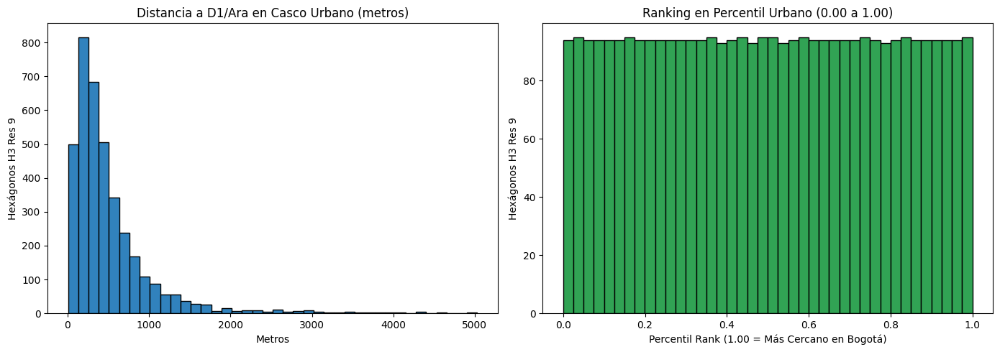

In [3]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(gdf_h3['val_dist_d1_ara'].dropna(), bins=40, color='#3182bd', edgecolor='black')
axes[0].set_title('Distancia a D1/Ara en Casco Urbano (metros)')
axes[0].set_xlabel('Metros')
axes[0].set_ylabel('Hexágonos H3 Res 9')

axes[1].hist(gdf_h3['rank_dist_d1_ara'].dropna(), bins=40, color='#31a354', edgecolor='black')
axes[1].set_title('Ranking en Percentil Urbano (0.00 a 1.00)')
axes[1].set_xlabel('Percentil Rank (1.00 = Más Cercano en Bogotá)')
axes[1].set_ylabel('Hexágonos H3 Res 9')

plt.tight_layout()
plt.show()

## 3. Mapa Coroplético de Calificación Urbana (Matplotlib)

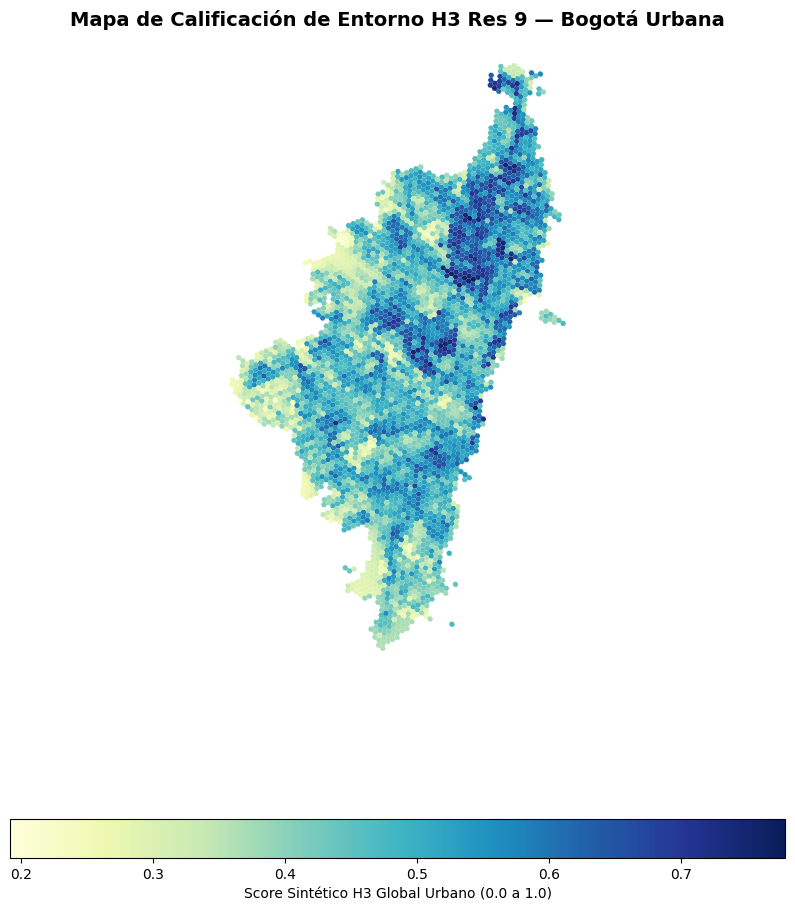

In [4]:
fig, ax = plt.subplots(figsize=(10, 12))
gdf_h3.plot(column='score_h3_global', cmap='YlGnBu', legend=True, ax=ax,
            legend_kwds={'label': 'Score Sintético H3 Global Urbano (0.0 a 1.0)', 'orientation': 'horizontal'})
ax.set_title('Mapa de Calificación de Entorno H3 Res 9 — Bogotá Urbana', fontsize=14, fontweight='bold')
ax.axis('off')
plt.show()

## 4. Mapa Interactivo Folium de Calificación de Entorno (Res 9)

In [5]:
centro_lat = gdf_h3['lat'].mean()
centro_lng = gdf_h3['lng'].mean()

m = folium.Map(location=[centro_lat, centro_lng], zoom_start=12, tiles='cartodbpositron')

folium.Choropleth(
    geo_data=ruta_h3,
    name='Score H3 Global Urbano',
    data=gdf_h3,
    columns=['h3_index', 'score_h3_global'],
    key_on='feature.properties.h3_index',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    line_opacity=0.1,
    legend_name='Score de Entorno H3 Global Urbano (Percentil)'
).add_to(m)

m.save('mapa_h3_interactivo.html')
print('Mapa interactivo guardado como mapa_h3_interactivo.html')
m

Mapa interactivo guardado como mapa_h3_interactivo.html
